# Mohammad's ideas:

1. ## Can we use (k,p) decomposition of a neural network to get better prediction performance than normal?

    ## Hypothesis: 
    (k,p) decomposition can yield better top-1 and top-5 accuracies for a model than prediction on the image itself.
    
    ## Experiments: 
    ### Testing top-1 accuracy:
    
    Take all the validation images from ImageNet.
    For each validation image v_i, perform (k,p) decomposition.
    Feed each decomposed and reconstructed image into a neural network and observe the top-1. Perform a majority vote on the predictions for each reconstructed image to get the overall top-1 accuracy. Compare this to the top-1 accuracy for a standard model.
    
    ### Testing top-5 accuracy:
    
    Take all the validation images from ImageNet.
    For each validation image v_i, perform (k,p) decomposition.
    Feed each decomposed and reconstructed image into a neural network and observe the top-5 predictions for each component. Make a histogram out of the predictions and take the top-5 and see if the ground truth lies in this.
    
2. ## Can we use this as an effective defense against arbitrary adversarial attacks?

    ## Hypothesis: 
    (k,p) decomposition as listed in the steps above can act as a very effective defense against adversarial samples, recovering 100% of the original labels from adversarial ones. In particular, using the (k,p) decomposition for ImageNet to recover the top-1 labels via a majority vote on the top-5 labels, I believe we can achieve a robust defense against even the strongest adversaries. We can benchmark our method against PGD for multiple epsilon values and multiple steps and show that its model agnostic. In particular, we can benchmark our performance against this paper : https://github.com/facebookresearch/ImageNet-Adversarial-Training

# KERNEL PCA DECOMPOSITION

In [ ]:
# Import basic required libraries
import foolbox
import torch
import torchvision.models as models
import numpy as np
from foolbox.criteria import TargetClassProbability
from foolbox import criteria
import random 
import os    
import matplotlib.pyplot as plt
import matplotlib
from sklearn.decomposition import PCA as RandomizedPCA
from sklearn.decomposition import KernelPCA
import pickle
from skimage import io, transform
from PIL import Image
from functions import *
import pandas as pd
import csv
import requests

# Problem: This creates an array with image duplicated in a 3x3 grid
def kernel_PCA_transform(img, dim, N):
    # Declare the object
    kernel = KernelPCA(kernel="rbf", n_components=N, fit_inverse_transform=True, gamma=20)
    
    # Reshape 
    img_r = np.reshape(img, (dim, dim*3))
    
    # Fit kernel to data 
    ipca = kernel.fit_transform(img_r)
    
    # Perform the inverse transform
    img_pca = kernel.inverse_transform(ipca)
    
    img_pca = np.reshape(img_pca[:], (dim, dim,3))

    return img_pca

mean = np.array([0.485, 0.456, 0.406]).reshape((3, 1, 1))
std = np.array([0.229, 0.224, 0.225]).reshape((3, 1, 1))

path = '/home/malhar/Desktop/data/'

# Load in the models
model_type = models.inception_v3(pretrained=True).eval()
if torch.cuda.is_available():
    model_type = model_type.cuda()

LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'

labels = {int(key):value for (key, value)
          in requests.get(LABELS_URL).json().items()}

filenames = [line.rstrip('\n') for line in open('filenames.txt')]

idxs, classes, nlabels = get_classes(filenames)

DIMS = 200

classes_exp = classes[0:DIMS]

k_preds_top_1 = []
k_preds_top_5 = []
ratios = []

# Get the component
for k in range(1,220,5):
    
    top_1_correct_preds = 0
    top_5_correct_preds = 0
    count = 0
    mean_ratios = 0
    
    for index_filename in range(DIMS):
        
        # Read in the filename from all possible filenames
        filename = filenames[index_filename]
        
        # Read in image
        img = obtain_image_from_index(index_filename)
        
        if ((len(img.shape) < 3)):
            continue
        
        # Get class number
        class_number = classes[index_filename]
        
        # Get ground truth label
        ground_truth_label = labels[class_number]
        
        # Convert image to torch tensor
        img_torch = torch.from_numpy(img).cuda()
        torch_input = torch.zeros((1,3,224,224))
        torch_input[0,0,:,:] = img_torch[:,:,0]
        torch_input[0,1,:,:] = img_torch[:,:,1]
        torch_input[0,2,:,:] = img_torch[:,:,2]
        torch_input = torch_input[:].cuda()
        
        # Run predictions on original image
        predictions = model_type(torch_input)
        
        # Get top prediction
        top_prediction = int(torch.argmax(predictions).detach().cpu().numpy())
        top_5_predictions = predictions.detach().cpu().numpy().argsort()[0,-5:][::-1]
        
        # PCA decomposition? Only test correctly predicted inputs
        if (count >= 10):
            break
        if (class_number == top_prediction):
            count += 1
            
            # Run PCA transformation
            PCA = kernel_PCA_transform(img, 224, k)
#             mean_ratios += ratio
            
            pca_filename = 'test_images/KERNEL_' + str(k) + '_ground_truth_' + str(class_number) + '_pcapredictions_' + str(top_prediction)
            pca_filename += '_' + filename + '.png'
            
            plt.imsave(pca_filename, PCA, format='png')
            
            # Perform a prediction on the PCA image
            img_torch_pca = torch.from_numpy(PCA).cuda()
            torch_input_pca = torch.zeros((1,3,224,224))
            torch_input_pca[0,0,:,:] = img_torch_pca[:,:,0]
            torch_input_pca[0,1,:,:] = img_torch_pca[:,:,1]
            torch_input_pca[0,2,:,:] = img_torch_pca[:,:,2]
            torch_input_pca = torch_input_pca[:].cuda()
            
            # Predict stuff on it now
            predictions_pca = model_type(torch_input_pca)
            
            # Get top prediction
            top_prediction_pca = int(torch.argmax(predictions_pca).detach().cpu().numpy())
            
#             print (k,'PCA Predicted: ', top_prediction_pca, labels[top_prediction_pca], 'Original: ', class_number, ground_truth_label)
            
            # Print it out
            if (top_prediction_pca == class_number):
                top_1_correct_preds += 1
            
            if (top_prediction_pca in top_5_predictions):
                top_5_correct_preds += 1
             
    print ('---------------------------')
    print ('Component: ', k)
    print ('Component wise top-1 accuracy: ', top_1_correct_preds / (1.0 * count), top_1_correct_preds, count)
    print ('Component wise top-5 accuracy: ', top_5_correct_preds / (1.0 * count), top_5_correct_preds, count)
#     print ('Mean ratio: ', mean_ratios/(1.0 * count))
    k_preds_top_1.append(top_1_correct_preds / (1.0 * count))
    k_preds_top_5.append(top_5_correct_preds / (1.0 * count))
#     ratios.append(mean_ratios/(1.0 * count))
    

In [ ]:
fig = plt.figure()

plt.plot(range(1,220,10), 100*np.array(k_preds_top_1), c='r', label='Top 1 prediction %')
plt.plot(range(1,220,10), 100*np.array(k_preds_top_5), c='k', label='Top 5 predictions %')
plt.legend()
plt.xlabel('Components')
plt.ylabel('Prediction accuracy (%)')
plt.title('50 images at each component')
plt.savefig('test_images/kpca_plots_10_imgs_' + '.pdf', format='pdf')

# DO IT FOR ADVERSARIAL SAMPLES NOW - USE AVAILABLE STUFF

Steps:
1. Import libraries
2. Import paths and filenames required
3. Iterate over the components. For each component:
    - Find the target class and the original class of the file from the filename
    - Extract the predictions for that particular component
    - Find the top class and store it somewhere

In [ ]:
from functions import *    

models = ['inception', 'resnet50', 'vgg19']

attack_names = ['CW', 'JSMA']

for model_name in models:
    for attack in attack_names:
        k_preds_top_1, adv_preds, xvals = behavior_of_adversarial_samples(model_name=model_name, attack_name=attack, number_used=50)
        import matplotlib.pyplot as plt

        fig = plt.figure()
        plt.plot(range(0,224), 100*np.array(k_preds_top_1), c='k', label='Top 1 prediction %')
        plt.plot(range(0,224), 100*np.array(adv_preds), c='r', label='Adversarial prediction %')
        plt.legend()
        plt.xlabel('Components')
        plt.ylabel('Prediction accuracy (%)')
        plt.title('50 images at each component')
        plt.savefig('test_images/adversarial_' + model_name + '_' + attack + '_plots_100_imgs_' + '.pdf', format='pdf')

In [ ]:
# Import basic required libraries
import os 
import numpy as np
import re

# Import paths and filenames
path = 'CW/resnet50/'
filenames = os.listdir(path)

k_preds_top_1 = []
k_preds_top_5 = []
adv_preds = []

# Iterate over the components
for k in range(224):
    
    top_1_correct_preds = 0
    top_5_correct_preds = 0
    adv_correct_preds = 0
    count = 0
    
    # Iterate over the filenames
    for filename in filenames:
        if (count >= 20):
            break
        if ('.csv' not in filename):
            continue
                    
        predictions = np.genfromtxt(path + filename, delimiter=',', invalid_raise = False)
        if (predictions.shape != (224,1000)):
            continue

        # Extract the target class and original class of the file from the filename
        numbers = re.findall(r'\d+', filename)
        target = int(numbers[2])
        original = int(numbers[3])

        # Extract the predictions for that particular component
        predictions_k = predictions[k,:]

        # Get top class
        top_class = int(np.argmax(predictions_k))
        top_5_predictions = predictions[-1:][0].argsort()[-5:][::-1]
        
        print (k, 'Topper:', top_class, ' Target:', target, ' Original:', original, filename)
        count += 1
        if (top_class == target):
            adv_correct_preds += 1
        if (top_class == original):
            top_1_correct_preds += 1
        if (top_class in top_5_predictions):
            top_5_correct_preds += 1
        
    print ('---------------------------')
    print ('Component: ', k)
    print ('Component wise top-1 accuracy: ', top_1_correct_preds / (1.0 * count), top_1_correct_preds, count)
#     print ('Component wise top-5 accuracy: ', top_5_correct_preds / (1.0 * count), top_5_correct_preds, count)
    print ('Component wise adversarial accuracy: ', adv_correct_preds / (1.0 * count), adv_correct_preds, count)
    
    k_preds_top_1.append(top_1_correct_preds / (1.0 * count))
#     k_preds_top_5.append(top_5_correct_preds / (1.0 * count))
    adv_preds.append(adv_correct_preds / (1.0 * count))

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure()

plt.plot(range(0,224), 100*np.array(k_preds_top_1), c='k', label='Top 1 prediction %')
plt.plot(range(0,224), 100*np.array(adv_preds), c='r', label='Adversarial prediction%')
plt.plot(range(0,224), 100*np.array(k_preds_top_5), c='g', label='Top 5 prediction%')
plt.legend()
plt.xlabel('Components')
plt.ylabel('Prediction accuracy (%)')
plt.title('50 images at each component')
plt.savefig('test_images/adversarial_resnet50_plots_50_imgs_' + '.pdf', format='pdf')

# TRY TO YIELD BETTER PREDICTION THAN NORMAL.

# TESTING TOP-1 ACCURACY

# STEPS:

1. Import basic libraries and filepaths, class lists, model parameters
2. Iterate over each image. For each image, generate PCA reconstructed and perform inference on it while accumulating true predictions for each PCA component. Measure true accuracy at the end.

In [ ]:
# 1. Import basic libraries and filepaths
# Import basic required libraries
import foolbox
import torch
import torchvision.models as models
import numpy as np
from foolbox.criteria import TargetClassProbability
import torch.nn as nn
from foolbox import criteria
import random 
import os    
import matplotlib.pyplot as plt
import matplotlib
from sklearn.decomposition import PCA as RandomizedPCA
from sklearn.decomposition import KernelPCA
import pickle
from skimage import io, transform
from PIL import Image
from functions import *
import pandas as pd
import csv
import requests
from collections import Counter

# Define the model and softmax function
model_name = 'inception'
smax = nn.Softmax(dim=1)

# Path to the files 
IMAGENET_VALIDATION_FILE_PATH = path + '/imagenet_validation_images/'
IMAGENET_VALIDATION_FILES = os.listdir(IMAGENET_VALIDATION_FILE_PATH)

# Split here
SPLIT = len(IMAGENET_VALIDATION_FILES)

# Get classes for each of the images
idxs, classes, nlabels = get_classes(IMAGENET_VALIDATION_FILES[0:SPLIT])

# Labels for each of the classes
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'
labels = {int(key):value for (key, value)
          in requests.get(LABELS_URL).json().items()}

# Define model and model parameters
mean = np.array([0.485, 0.456, 0.406]).reshape((3, 1, 1))
std = np.array([0.229, 0.224, 0.225]).reshape((3, 1, 1))

if (model_name == 'inception'):
    model_type = models.inception_v3(pretrained=True).eval()
    if torch.cuda.is_available():
        model_type = model_type.cuda()

elif (model_name == 'resnet50'):
    model_type = models.resnet50(pretrained=True).eval()
    if torch.cuda.is_available():
        model_type = model_type.cuda()

elif (model_name == 'vgg19'):
    model_type = models.vgg19(pretrained=True).eval()
    if torch.cuda.is_available():
        model_type = model_type.cuda()

## 2. Iterate over each image. 

## For each image, generate PCA reconstructed and perform inference on it while accumulating true predictions for each PCA component. 

## Let the top-1 accuracy be the majority of predictions for the components. Term this as the recovered rate.

## We need to see if the recovered rate accuracy > true prediction accuracy

In [ ]:
# Define the files we want to iterate over
filenames_input = IMAGENET_VALIDATION_FILES[0:SPLIT]

true_predictions = 0
recovered_predictions = 0

# Iterate over each image
for i in range(SPLIT):
    img = obtain_image_from_index(i, filenames_input)
    
    if (len(img.shape) < 3):
        continue
    
    original_class = classes[i]
    original_label = labels[(classes[i])]
    
    # Convert it to a PyTorch Tensor first
    img_transposed_torch = convert_numpy_to_torch_for_inference(img, mean, std).float().cuda()
    
    # Perform inference on the original image; it works!
    predictions = model_type(img_transposed_torch)
    predictions_softmax = smax(predictions)
    top_1_prediction = int(torch.argmax(predictions))
    top_5_predictions = predictions.detach().cpu().numpy().argsort()[0,-5:][::-1]
    
#     if (top_1_prediction == original_class or original_class in top_5_predictions):
#         continue
    
    print 'Full image prediction'
    print '%d Top prediction: %d, Ground truth: %d, filename: %s' %(i, top_1_prediction,original_class, filenames_input[i])
    
    if (top_1_prediction == original_class):
        true_predictions += 1
    
    # Decompose our image
    top_1_predictions_components = []
    top_5_predictions_components = []
    for k in range(224):
        decomposed, ratio = PCA_transform(img, 224, k)
        
        # Convert to torch
        decomposed_transposed_torch = convert_numpy_to_torch_for_inference(decomposed, mean, std).float().cuda()
        
        # Perform inferences
        predictions_decomp = model_type(decomposed_transposed_torch)
        predictions_softmax_decomp = smax(predictions_decomp)
        top_1_prediction_decomp  = int(torch.argmax(predictions_decomp))
        top_5_predictions_decomp  = predictions_decomp.detach().cpu().numpy().argsort()[0,-5:][::-1]
        print 'Decomposed, k: %d Top prediction: %d, Ground truth: %d, top-5: %s' %(k, top_1_prediction_decomp,original_class, top_5_predictions_decomp)
        
        top_1_predictions_components.append(top_1_prediction_decomp)
        top_5_predictions_components.append(top_5_predictions_decomp)
    
    top_5_flattened = np.array(top_5_predictions_components).flatten()
#     y = np.bincount(top_5_flattened)
#     ii = np.nonzero(y)[0]
#     print (zip(ii,y[ii]))

    # Make histogram out of top-1 predictions
    t1_hist = np.bincount(np.array(top_1_predictions_components))
    indices = np.nonzero(t1_hist)[0]
    print 'Predictions: ', zip(indices, t1_hist[indices])
    
    # Get the most common prediction
    c = Counter(top_1_predictions_components)
    recovered_prediction = c.most_common(1)[0][0]
    if (recovered_prediction == original_class):
        recovered_predictions += 1
    
    print 'Recovered prediction:', recovered_prediction
    print 'Conventional prediction rate: ', true_predictions / (1.0 * (i+1))
    print 'Recovered prediction rate: ', recovered_predictions / (1.0 * (i+1))
    print ('\n\n\n')

2. ## Defense against arbitrary adversarial attacks?

    ## Hypothesis (ALSO JEFFREY'S PROJECT BTW): 
    (k,p) decomposition as listed in the steps above can act as a very effective defense against adversarial samples, recovering 100% of the original labels from adversarial ones. In particular, using the (k,p) decomposition for ImageNet to recover the top-1 labels via a majority vote on the top-5 labels, I believe we can achieve a robust defense against even the strongest adversaries. We can benchmark our method against PGD for multiple epsilon values and multiple steps and show that its model agnostic. In particular, we can benchmark our performance against this paper : https://github.com/facebookresearch/ImageNet-Adversarial-Training
    
    ## Experimental Setup:
    1. Define basic parameters, such as the model, filepaths and parameters and modules we need to load in.
    2. Generate N adversarial samples using PGD with parameters specified in paper above. Specifically, they are:
        Epsilon: 16
        Step size: alpha=1
        Steps: 10, 100, 200, 500, 1000, 2000
        Number of images: 1000 validation images.
    3. Perform inference on each of the images and find the average prediction accuracy of the original classes for the adversarial samples. Let this be A1.
    4. Perform the majority-voting algorithm on each of the images and find average prediction accuracy of the original classes for the adversarial samples. Let this be A2.
    
        

In [1]:
# A: Define basic parameters
# Import basic required libraries
import foolbox
import torch
import torchvision.models as models
import numpy as np
from foolbox.criteria import TargetClassProbability
import torch.nn as nn
from foolbox import criteria
import random 
import os    
import matplotlib.pyplot as plt
import matplotlib
from sklearn.decomposition import PCA as RandomizedPCA
from sklearn.decomposition import KernelPCA
import pickle
from skimage import io, transform
from PIL import Image
from functions import *
import time
import pandas as pd
import csv
import requests
from collections import Counter
import warnings
warnings.filterwarnings("ignore")
from textwrap import wrap

# Define the model and softmax function
model_name = 'inception'
smax = nn.Softmax(dim=1)

# Path to the files 
IMAGENET_VALIDATION_FILE_PATH = path + '/imagenet_validation_images/'
IMAGENET_VALIDATION_FILES = os.listdir(IMAGENET_VALIDATION_FILE_PATH)

# Split here - MODIFY LATER
SPLIT = len(IMAGENET_VALIDATION_FILES)

# Get classes for each of the images
idxs, classes, nlabels = get_classes(IMAGENET_VALIDATION_FILES[0:SPLIT])

# Labels for each of the classes
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'
labels = {int(key):value for (key, value)
          in requests.get(LABELS_URL).json().items()}

# Define model and model parameters
mean = np.array([0.485, 0.456, 0.406]).reshape((3, 1, 1))
std = np.array([0.229, 0.224, 0.225]).reshape((3, 1, 1))

if (model_name == 'inception'):
    model_type = models.inception_v3(pretrained=True).eval()
    if torch.cuda.is_available():
        model_type = model_type.cuda()

elif (model_name == 'resnet50'):
    model_type = models.resnet50(pretrained=True).eval()
    if torch.cuda.is_available():
        model_type = model_type.cuda()

elif (model_name == 'vgg19'):
    model_type = models.vgg19(pretrained=True).eval()
    if torch.cuda.is_available():
        model_type = model_type.cuda()
        
        

In [4]:
IMAGENET_VALIDATION_FILE_PATH

'/home/malhar/Desktop/data//imagenet_validation_images/'

Making fmodel
iteration 0, filename ILSVRC2012_val_00027063.JPEG
loading image...
loaded image!
Generating adversarial
Generated adversarial
l_inf: 0.062500
Prediction on original image: 2
Original class: 2
Prediction on adversarial sample: 504
Target class: 504 
6.12739300728
Decomposed, k: 0 Top prediction: 629, Ground truth: 2, ratio: 0.000000
Intermediate label: lipstick, lip rouge
Decomposed, k: 2 Top prediction: 807, Ground truth: 2, ratio: 0.566435
Intermediate label: solar dish, solar collector, solar furnace
Decomposed, k: 4 Top prediction: 756, Ground truth: 2, ratio: 0.702089
Intermediate label: rain barrel
Decomposed, k: 6 Top prediction: 898, Ground truth: 2, ratio: 0.738139
Intermediate label: water bottle
Decomposed, k: 8 Top prediction: 2, Ground truth: 2, ratio: 0.763235
Intermediate label: great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias
Decomposed, k: 10 Top prediction: 2, Ground truth: 2, ratio: 0.782029
Intermediate label: great w

Decomposed, k: 126 Top prediction: 504, Ground truth: 2, ratio: 0.986027
Intermediate label: coffee mug
Decomposed, k: 128 Top prediction: 504, Ground truth: 2, ratio: 0.986670
Intermediate label: coffee mug
Decomposed, k: 130 Top prediction: 504, Ground truth: 2, ratio: 0.987281
Intermediate label: coffee mug
Decomposed, k: 132 Top prediction: 504, Ground truth: 2, ratio: 0.987878
Intermediate label: coffee mug
Decomposed, k: 134 Top prediction: 504, Ground truth: 2, ratio: 0.988416
Intermediate label: coffee mug
Decomposed, k: 136 Top prediction: 504, Ground truth: 2, ratio: 0.988961
Intermediate label: coffee mug
Decomposed, k: 138 Top prediction: 504, Ground truth: 2, ratio: 0.989489
Intermediate label: coffee mug
Decomposed, k: 140 Top prediction: 504, Ground truth: 2, ratio: 0.989978
Intermediate label: coffee mug
Decomposed, k: 142 Top prediction: 504, Ground truth: 2, ratio: 0.990462
Intermediate label: coffee mug
Decomposed, k: 144 Top prediction: 504, Ground truth: 2, ratio: 

KeyboardInterrupt: 

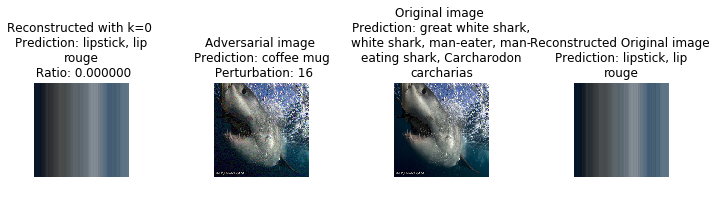

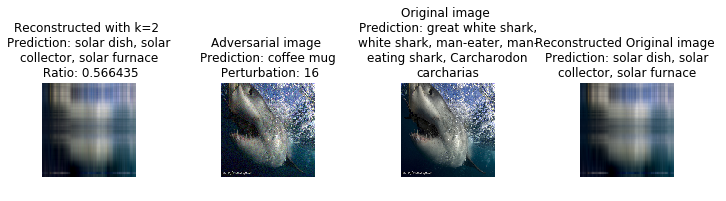

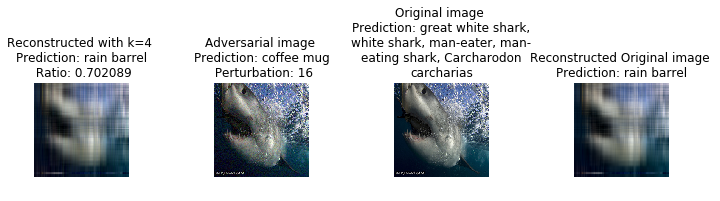

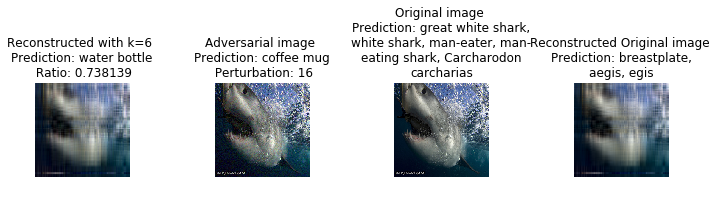

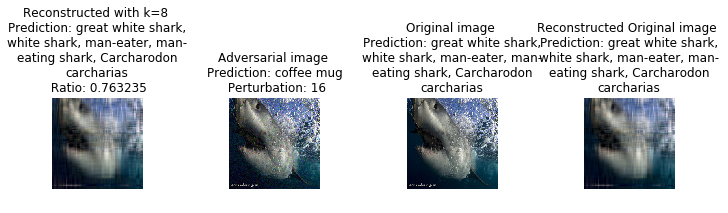

...

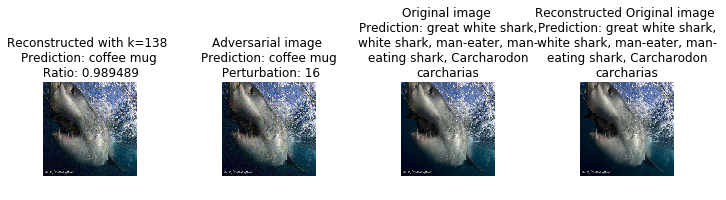

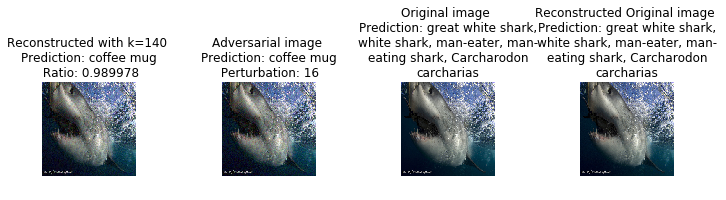

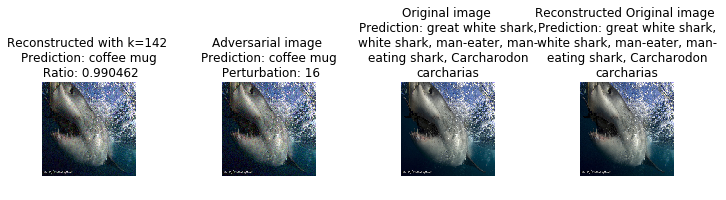

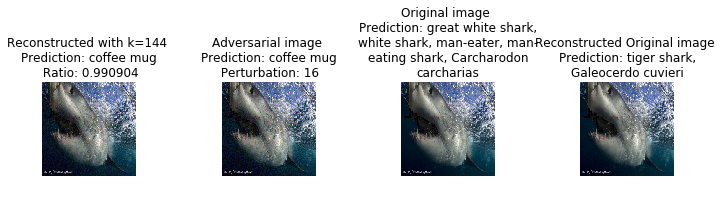

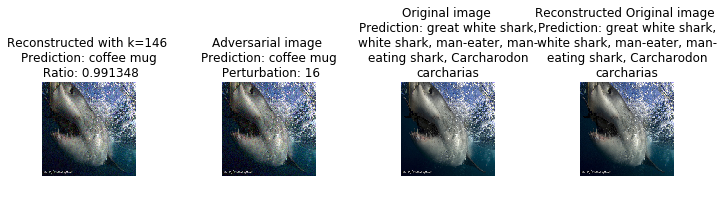

In [3]:
from matplotlib import rc

rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
## for Palatino and other serif fonts use:
#rc('font',**{'family':'serif','serif':['Palatino']})
# rc('text', usetex=True)

# B: Generate N adversarial samples using PGD

# Define the files we want to iterate over
filenames_input = IMAGENET_VALIDATION_FILES[0:SPLIT]

print 'Making fmodel'
fmodel = foolbox.models.PyTorchModel(
        model_type, bounds=(0, 1), num_classes=1000, preprocessing=(mean, std))

path = '/home/malhar/Desktop/data/'

true_predictions = 0
recovered_predictions = 0
iters = 1
for j in range(iters):
    
    i = np.random.randint(1,20000)
    
    print 'iteration %d, filename %s' %(j, filenames_input[i])
    
    # Read in the image
    print 'loading image...'
    img = obtain_image_from_index(i, filenames_input)
    print 'loaded image!'
    
    
    # Exit condition
    if (len(img.shape) < 3):
        continue
    
    # Obtain original class and original label
    original_class = classes[i]
    original_label = labels[(classes[i])]
    
    # Generate the target label
    target_class = np.random.randint(0,999)
    
    if (target_class == original_class):
        while (target_class == original_class):
            target_class = random.randint(0,999)
    target_label = labels[target_class]
    
    # Generate the adversarial sample
    epsilon = 16
    linf_val = epsilon / (1.0*256)
#     linf_val = 0.05
    start = time.time()

    # Generates adversarial sample with shape 3x224x224
    print 'Generating adversarial'
    adversarial = generate_PGD_with_random_adversarial_sample(target_class, 
                                                              img, fmodel, 
                                                              linf_val, iters=200, 
                                                              binary_choice=False, stepsize_choice=0.01)
    print 'Generated adversarial'
    
    if (adversarial is None):
        continue
    
    adversarial_reshaped = np.transpose(adversarial, (1,2,0))
    
    print 'l_inf: %f'%(np.abs(np.max(adversarial_reshaped - img)))
    
    print 'Prediction on original image: %d' % np.argmax(fmodel.predictions(np.transpose(img, (2, 0, 1))))
    print 'Original class: %d' % original_class
    print 'Prediction on adversarial sample: %d' % np.argmax(fmodel.predictions(adversarial))
    print 'Target class: %d ' % target_class
    print (time.time() - start)
    
    # Decompose our image
    top_1_predictions_components = []
    top_5_predictions_components = []
        
    # Only look at results for correctly predicted models
    if (original_class != np.argmax(fmodel.predictions(np.transpose(img, (2, 0, 1))))):
        continue
    
    for k in range(0, 200, 2):
#         decomposed = kernel_PCA_transform(adversarial_reshaped, 224, k)
        decomposed, ratio = PCA_transform(adversarial_reshaped, 224, k)
    
        decomposed_original, ratio_original = PCA_transform(img, 224, k)
        
#         ratio = 0
#         print adversarial_reshaped.shape
        
        # Perform inferences on adversarial decomposed image
        predictions_decomp = fmodel.predictions(np.transpose(decomposed, (2, 0, 1)))
        top_1_prediction_decomp  = int(np.argmax(predictions_decomp))
        top_5_predictions_decomp  = predictions_decomp.argsort()[-5:][::-1]
        print 'Decomposed, k: %d Top prediction: %d, Ground truth: %d, ratio: %f' %(k, top_1_prediction_decomp,original_class, ratio)
        print 'Intermediate label: %s'%labels[top_1_prediction_decomp]
        top_1_predictions_components.append(top_1_prediction_decomp)
        top_5_predictions_components.append(top_5_predictions_decomp)
        
        
        predictions_decomp_original = fmodel.predictions(np.transpose(decomposed_original, (2, 0, 1)))
        top_1_prediction_decomp_original  = int(np.argmax(predictions_decomp_original))
        top_5_predictions_decomp_original  = predictions_decomp_original.argsort()[-5:][::-1]
        
        plt.figure(figsize=(10,10), tight_layout=True)
        plt.subplot(1,4,1)
        plt.imshow(decomposed)
        title1 = 'Reconstructed with k=%d \n' %k
        title1 += '\n'.join(wrap('Prediction: %s'%(labels[top_1_prediction_decomp]),30))
#         title1 += '\n Ratio: %f'%ratio
        plt.title(title1)
        plt.axis('off')

        plt.subplot(1,4,2)
        plt.imshow(adversarial_reshaped)
        title2 = 'Adversarial image \n'
        title2 += '\n'.join(wrap('Prediction: %s'%(labels[target_class]),30))
#         title2 += '\n Perturbation: %d'%epsilon
        plt.title(title2)
        plt.axis('off')

        
        plt.subplot(1,4,3)
        plt.imshow(img)
        title3 = 'Original image \n'
        title3 += '\n'.join(wrap('Prediction: %s'%(labels[original_class]),30))
        plt.title(title3)
        plt.axis('off')
        
        plt.subplot(1,4,4)
        plt.imshow(decomposed_original)
        title3 = 'Reconstructed Original image \n'
        title3 += '\n'.join(wrap('Prediction: %s'%(labels[top_1_prediction_decomp_original]),30))
        plt.title(title3)
        plt.axis('off')
    
    t1_hist = np.bincount(np.array(top_1_predictions_components))
    indices = np.nonzero(t1_hist)[0]
    print 'Predictions: ', zip(indices, t1_hist[indices])
    
    # Get the most common prediction
    c = Counter(top_1_predictions_components)
    recovered_prediction = c.most_common(1)[0][0]
    if (recovered_prediction == original_class):
        recovered_predictions += 1
    
    print 'Recovered prediction:', recovered_prediction
    print 'Recovery rate : %.3f' % (int(recovered_predictions)/(1.0 * (int(i)+1))), recovered_predictions, i+1
    print ('\n\n\n')
    print ('\n\n')

## Results of above experiment: 

In [30]:
from matplotlib import rc

rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
## for Palatino and other serif fonts use:
#rc('font',**{'family':'serif','serif':['Palatino']})
# rc('text', usetex=True)

# B: Generate N adversarial samples using PGD

# Define the files we want to iterate over
filenames_input = IMAGENET_VALIDATION_FILES[0:SPLIT]

print 'Making fmodel'
fmodel = foolbox.models.PyTorchModel(
        model_type, bounds=(0, 1), num_classes=1000, preprocessing=(mean, std))

path = '/home/malhar/Desktop/data/'

true_predictions = 0
recovered_predictions = 0
iters = 1
for j in range(iters):
    
    i = np.random.randint(1,20000)
    
    print 'iteration %d, filename %s' %(j, filenames_input[i])
    
    # Read in the image
    print 'loading image...'
    img = obtain_image_from_index(i, filenames_input)
    print 'loaded image!'
    
    ratio_originals = []

    for k in range(224):
        decomposed_original_0, ratio_original = PCA_transform(img, 224, k)
        ratio_originals.append(ratio_original)
    
    decomposed_original_0, ratio_original = PCA_transform(img, 224, 0)
    decomposed_original_1, ratio_original = PCA_transform(img, 224, 5)
    decomposed_original_2, ratio_original = PCA_transform(img, 224, 10)
    decomposed_original_3, ratio_original = PCA_transform(img, 224, 20)
    
    
    w=10
    h=10
    fig=plt.figure(figsize=(8, 8))
    fig.add_subplot(rows, columns, 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title('Original')
    
    columns = 4
    rows = 5
    for i in range(2, columns*rows +1):
        decomposed_original, ratio_original = PCA_transform(img, 224, i-1)
        fig.add_subplot(rows, columns, i)
        plt.imshow(decomposed_original)
        plt.title('k=%d'%(i + 1))
        plt.axis('off')
#     plt.show()

#     plt.tight_layout()
    plt.savefig('test_images/AAAI20_EDMSLS' + '.pdf', format='pdf')

Making fmodel
iteration 0, filename ILSVRC2012_val_00042992.JPEG
loading image...
loaded image!


KeyboardInterrupt: 

In [32]:
ratio_originals = []

for k in range(224):
    decomposed_original_0, ratio_original = PCA_transform(img, 224, k)
    print k
    ratio_originals.append(ratio_original)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223


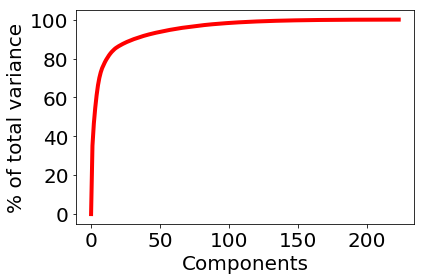

In [55]:
plt.plot(range(224), 100 * np.array(ratio_originals), c='r',linewidth=4)
plt.xlabel('Components', fontsize=20)
plt.ylabel('% of total variance', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.tight_layout()
plt.savefig('test_images/variance_vs_components' + '.pdf', format='pdf')